## This is an overview of how to analyze, plot, and interrogate blood flow kymographs.

### Import some Python packages

In [28]:
%load_ext autoreload
%autoreload 2

import pandas as pd

import plotly.express as px
import plotly.graph_objects as go

usePlotlyTemplate = 'plotly_dark'
usePlotlyTemplate = 'plotly_light'


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## This notebook assumes you have analyzed your tif files. See `notebook (0)`.

## Explore the raw data and velocity measurements

This assumes the kymographs have been analyzed.

In [29]:
import analyzeflow.interface

folderPath = '../../declan-flow-analysis-shared/20221102'  # thinned skull
folderPath = '../../declan-flow-analysis-shared/20221202'  # thinned skull

kfw = analyzeflow.interface.kymFlowWidget(folderPath)

## Create a summary for a list of folders.

This is a little complicated because of repeat file names like `capillary 1`.

In [30]:
import analyzeflow.kymFlowUtil

folderPathList = [
    '../../declan-flow-analysis-shared/20221102',
    '../../declan-flow-analysis-shared/20221202',
    '../../declan-flow-analysis-shared/20221206',
]    

timeLimitDict = {
    'Capillary4_0002.tif': {'minTime':0, 'maxTime':23}
}
#timeLimitDict = None
removeOutliers = True
medianFilter = 5

dfSummary = pd.DataFrame()
for folderPath in folderPathList:
    oneDf = analyzeflow.kymFlowUtil.makeSummaryTable_v3(folderPath,
                            removeOutliers=removeOutliers,
                               medianFilter=medianFilter)
    
    # add a column for type of craniotomy
    surgeryType = ''
    genotype = ''
    sex = ''
    if folderPath.endswith('20221102'):
        age = 'old'
        surgeryType = 'craniotomy'
        genotype = 'wt'
        sex = 'female'
    elif folderPath.endswith('20221202'):
        age = 'young'
        surgeryType = 'thinned skull'
        genotype = 'wt'
        sex = 'female'
    elif folderPath.endswith('20221206'):
        age = 'young'
        surgeryType = 'craniotomy'
        genotype = 'wt'
        sex = 'female'
        
    oneDf['Surgery Type'] = surgeryType
    oneDf['Genotype'] = genotype
    oneDf['Sex'] = sex
    oneDf['Age'] = age
    
    dfSummary = pd.concat([dfSummary, oneDf])
    
display(dfSummary)

# save dfSummary for declan
saveSummary = '../../declan-flow-analysis-shared/flowSummary-20221208.csv'
print('saveSummary:', saveSummary)
dfSummary.to_csv(saveSummary)


,parentFolder,file,uniqueFile,pntsPerLine,numLines,delx,delt,Total Dur (s),Line Length (um),meanInt,...,rangeVel,meanVel,stdVel,nTotal,nNonNan,nNan,Surgery Type,Genotype,Sex,Age
0,20221102,Capillary1_0001.tif,20221102/Capillary1_0001.tif,38,30000,0.284,0.001170,35.099,10.792,209.771670,...,1.000014,1.232232,0.131374,7497,7042,455,craniotomy,wt,female,old
1,20221102,Capillary2.tif,20221102/Capillary2.tif,25,30000,0.331,0.001146,34.379,8.275,152.226555,...,0.686352,1.484161,0.130341,7497,7364,133,craniotomy,wt,female,old
2,20221102,Capillary3.tif,20221102/Capillary3.tif,42,30000,0.331,0.001178,35.339,13.902,171.433600,...,1.214801,1.967500,0.270163,7497,7424,73,craniotomy,wt,female,old
3,20221102,Capillary4_0002.tif,20221102/Capillary4_0002.tif,40,30000,0.398,0.001174,35.219,15.920,198.600472,...,1.529227,0.648371,0.426884,7497,7480,17,craniotomy,wt,female,old
4,20221102,Capillary5_0001.tif,20221102/Capillary5_0001.tif,42,30000,0.398,0.001178,35.339,16.716,197.579637,...,1.624374,0.710805,0.392211,7497,7439,58,craniotomy,wt,female,old
5,20221102,Capillary6_0001.tif,20221102/Capillary6_0001.tif,30,30000,0.398,0.001154,34.619,11.940,227.052580,...,1.071815,1.593820,0.195337,7497,7293,204,craniotomy,wt,female,old
6,20221102,Capillary7_0001.tif,20221102/Capillary7_0001.tif,35,30000,0.398,0.001166,34.979,13.930,186.919394,...,0.950276,1.970692,0.214354,7497,7191,306,craniotomy,wt,female,old
0,20221202,Capillary 1.tif,20221202/Capillary 1.tif,33,30000,0.497,0.001162,34.859,16.401,14.054736,...,0.562051,0.978753,0.115409,7497,7195,302,thinned skull,wt,female,young
1,20221202,Capillary 2.tif,20221202/Capillary 2.tif,31,30000,0.497,0.001158,34.739,15.407,17.619815,...,0.959073,1.810709,0.200264,7497,7222,275,thinned skull,wt,female,young
2,20221202,Capillary10.tif,20221202/Capillary10.tif,23,30000,0.497,0.001142,34.259,11.431,19.706983,...,0.588163,1.250752,0.130638,7497,7292,205,thinned skull,wt,female,young


saveSummary: ../../declan-flow-analysis-shared/flowSummary-20221208.csv


In [31]:
usePlotlyTemplate = 'plotly_white'
usePlotlyTemplate = 'plotly_dark'
usePlotlyTemplate = 'presentation'

fig = px.bar(dfSummary, x="uniqueFile", y="meanVel",
                 color='Surgery Type',
                 error_y="stdVel",
                 hover_data=['uniqueFile'],
                template=usePlotlyTemplate)

#fig.update_layout(yaxis_title="Velocity +/- Std (mm/s)")  # change if you change y='meanVel'
#fig.update_layout(xaxis_title="Unique File")
fig.update_layout(template=usePlotlyTemplate)

fig.show()

## See if image intensity predicts variability in velocity measurements

For example, look at mean (or max) intensity versus std in estimated flow.

If there is a linear trend, we have problems.

In [32]:
fig = px.scatter(dfSummary, x="meanInt", y="meanVel",
                 color='Surgery Type',
                 symbol='Age',
                 error_y="stdVel",
                 hover_data=['uniqueFile'],
                template=usePlotlyTemplate)
fig.show()

## Test hypothesis that there is a difference bewteen open craniotomy and thinned skull

This might be broken!!!

In [33]:
import scipy.stats

dfOpenSkull = dfSummary[ dfSummary['Surgery Type'] == 'craniotomy']
dfThinnedSkull = dfSummary[ dfSummary['Surgery Type'] == 'thinned skull']

# display(dfOpenSkull)
# display(dfThinnedSkull)

meanVel_open = dfOpenSkull['meanVel']
meanVel_thinned = dfThinnedSkull['meanVel']
ans = scipy.stats.kruskal(meanVel_open, meanVel_thinned)
print('Null hypothesis: "mean velocity is different between open and thinned skull"')
print('   ', ans)

stdVel_open = dfOpenSkull['stdVel']
stdVel_thinned = dfThinnedSkull['stdVel']
ans = scipy.stats.kruskal(stdVel_open, stdVel_thinned)
print('Null hypothesis: "std velocity is different between open and thinned skull"')
print('   ', ans)

rangeVel_open = dfOpenSkull['rangeVel']
rangeVel_thinned = dfThinnedSkull['rangeVel']
ans = scipy.stats.kruskal(rangeVel_open, rangeVel_thinned)
print('Null hypothesis: "range of velocity is different between open and thinned skull"')
print('   ', ans)

meanInt_open = dfOpenSkull['meanInt']
meanInt_thinned = dfThinnedSkull['meanInt']
ans = scipy.stats.kruskal(meanInt_open, meanInt_thinned)
print('Null hypothesis: "image intensity is different between open and thinned skull"')
print('   ', ans)


Null hypothesis: "mean velocity is different between open and thinned skull"
    KruskalResult(statistic=0.0444444444444656, pvalue=0.8330288937194821)
Null hypothesis: "std velocity is different between open and thinned skull"
    KruskalResult(statistic=1.6000000000000085, pvalue=0.2059032107320635)
Null hypothesis: "range of velocity is different between open and thinned skull"
    KruskalResult(statistic=1.7361111111111143, pvalue=0.18763232999488008)
Null hypothesis: "image intensity is different between open and thinned skull"
    KruskalResult(statistic=0.0444444444444656, pvalue=0.8330288937194821)


## Compare Matlab Drew Radon versus Python Radon

Conclude, the results are the same. Usually around 5% different.

7497
7497


<IPython.core.display.Javascript object>


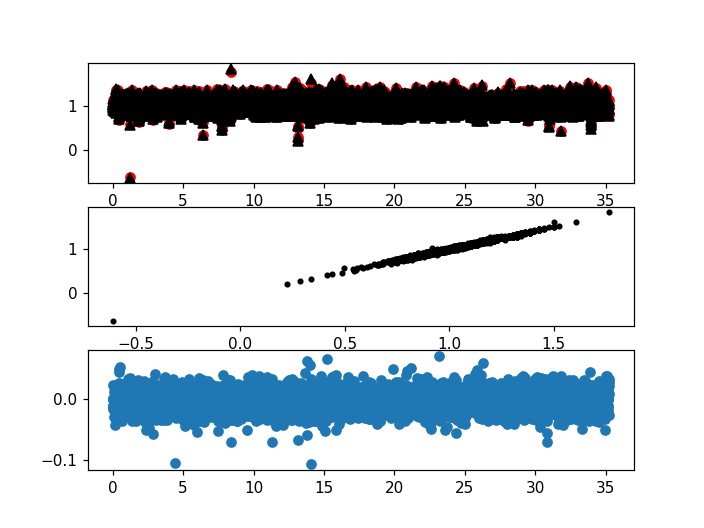

mean difference between m and p: -0.0023137884875362013


In [36]:
import numpy as np
import analyzeflow.kymFlowUtil

# load python drew and matlab drew to compare
# tifPath = '/Users/cudmore/Dropbox/data/declan/20221202/Capillary 1.tif'
# tifPath = '/Users/cudmore/Dropbox/data/declan/20221202/Capillary 2.tif'
# tifPath = '/Users/cudmore/Dropbox/data/declan/20221202/Capillary3.tif'
# tifPath = '/Users/cudmore/Dropbox/data/declan/20221202/Capillary4.tif'

tifPath = '../../declan-flow-analysis-shared/20221202/Capillary4.tif'

# matlab answer
mCsv = analyzeflow.kymFlowUtil._getCsvFile(tifPath)
mDf = pd.read_csv(mCsv)
mDf = mDf[ mDf['algorithm']=='drew']
mTime = mDf['time']
mVel = mDf['velocity'].to_numpy()
print(len(mDf))

# cudmore python answer
pCsv = analyzeflow.kymFlowUtil._getCsvFile_v2(tifPath)
pDf = pd.read_csv(pCsv)
pTime = pDf['time']
pVel = pDf['velocity'].to_numpy()
print(len(pDf))

%matplotlib notebook
import matplotlib.pyplot as plt
fig, axs = plt.subplots(3, sharex=False)
axs[0].plot(mTime, mVel, 'or')
axs[0].plot(pTime, pVel, '^k')

axs[1].plot(mVel, pVel, '.k')

# print('mTime:', mTime.shape)
# print('mVel:', mVel.shape)
# print('pVel:', pVel.shape)
_sub = np.subtract(mVel, pVel)
# print('_sub', _sub.shape)
print('mean difference between m and p:', np.nanmean(_sub))

axs[2].plot(mTime, _sub, 'o')
plt.show()


## Ask if velocity is different between Matlab chhatbar and Python Drew Radon

TODO: REMOVE OUTLIERS

In [37]:
from analyzeflow import kymFlowFile

# THIS IS CUDMORE LAPTOP PATH
tifFile = '/Users/cudmore/Dropbox/data/declan/20221102/Capillary1_0001.tif'
kff = kymFlowFile(tifFile)

# python radon
dfPython = kff._df
velPythonRadon = dfPython['velocity'].to_numpy()
velPythonRadon = analyzeflow.kymFlowUtil._removeOutliers(velPythonRadon)
velPythonRadon = velPythonRadon[~np.isnan(velPythonRadon)]  # remove nan

# matlab drew radon
dfMatlab = kff._dfMatlab
velMatlabDrew = dfMatlab[ dfMatlab['algorithm']=='drew' ]['velocity'].to_numpy()
velMatlabDrew = analyzeflow.kymFlowUtil._removeOutliers(velMatlabDrew)
velMatlabDrew = velMatlabDrew[~np.isnan(velMatlabDrew)]  # remove nan

velMatlabChhatbar = dfMatlab[ dfMatlab['algorithm']=='chhatbar' ]['velocity'].to_numpy()
velMatlabChhatbar = analyzeflow.kymFlowUtil._removeOutliers(velMatlabChhatbar)
velMatlabChhatbar = velMatlabChhatbar[~np.isnan(velMatlabChhatbar)]  # remove nan

print('Null hypothesis: "velcity of matlab Drew is different from velocity of python radon"')
print(f'  velPythonRadon: mean:{np.mean(velPythonRadon)} std:{np.std(velPythonRadon)}')
print(f'  velMatlabDrew: mean:{np.mean(velMatlabDrew)} std:{np.std(velMatlabDrew)}')
ans = scipy.stats.kruskal(velPythonRadon, velMatlabDrew)
print('   ', ans)

print('Null hypothesis: "velcity of matlab Chhatbar is different from velocity of python radon"')
ans = scipy.stats.kruskal(velPythonRadon, velMatlabChhatbar)
print('   ', ans)



FileNotFoundError: [Errno 2] No such file or directory: '/Users/cudmore/Dropbox/data/declan/20221102/Capillary1_0001.tif'